In [53]:
#from nilearn import plotting
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from nilearn import image
from nilearn import signal
from nilearn.maskers import NiftiMasker
from nilearn.maskers import NiftiMapsMasker
from nilearn.plotting import plot_roi
import nilearn as nl 
import nibabel as nb
from sklearn.decomposition import PCA
import bids
import os
import glob
import ray
import psutil


In [112]:
ray.shutdown()

num_cpus = psutil.cpu_count(logical=False)

ray.init(num_cpus=num_cpus)

@ray.remote
def fit_mask_get_PC1(current_mask, sub_data):
    try:
        fit_2_mask = current_mask.fit_transform(sub_data)
        PCA_instance = PCA(n_components=1)
        PCA_instance.fit(fit_2_mask)
        PC1_score = PCA_instance.explained_variance_ratio_[0]
    except ValueError:
        PC1_score = 0
    return PC1_score


2023-08-03 17:51:40,029	INFO worker.py:1612 -- Started a local Ray instance. View the dashboard at 127.0.0.1:8265 


In [3]:
ray.shutdown()

## Open Directory

In [4]:
# Now open a directory/folder 
fd = os.open("/Users/luisalvarez/Documents/Research_Elective_Data", os.O_RDONLY)

# Use os.fchdir() method to change the dir/folder
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

Current working dir : /Users/luisalvarez/Documents/Research_Elective_Data


In [5]:
def get_files(path):
    for file in os.listdir(path):
        if os.path.isfile(os.path.join(path, file)):
            return file

In [6]:
# Store the "path's" for each '.nii' file

# Store file names
COC_PP_1_paths = []
COC_PP_2_paths = []
PLA_PP_1_paths = []
PLA_PP_2_paths = []

# Set paths for each session folder
dir_path1 = os.getcwd()
dir_path1 += "/CANCOC_PP_1"

dir_path2 = os.getcwd()
dir_path2 += "/CANCOC_PP_2"

# Iterate directory
for path in os.listdir("CANCOC_PP_1"):
    
    if os.path.isdir(os.path.join(dir_path1, path)):
           
        currentsub_path = os.path.join(dir_path1, path)
            
        path_coc = path+"COC"
        path_pla = path+"PLA"
    
        if os.path.isdir(os.path.join(currentsub_path, path_coc)): 
            current_sub_coc_file = get_files(os.path.join(currentsub_path, path_coc))
            current_sub_coc_file = os.path.join(os.path.join(os.path.join("CANCOC_PP_1/", path), path_coc), current_sub_coc_file)
            #os.path.join(os.path.join(path, path_coc), current_sub_coc_file)
            COC_PP_1_paths.append(current_sub_coc_file)
        else: 
            print(os.path.join(currentsub_path, path_coc))
        
        if os.path.isdir(os.path.join(currentsub_path, path_pla)): 
            current_sub_pla_file = get_files(os.path.join(currentsub_path, path_pla))
            current_sub_pla_file = os.path.join(os.path.join(os.path.join("CANCOC_PP_1/", path), path_pla), current_sub_pla_file)
            #current_sub_pla_file = os.path.join(os.path.join(currentsub_path, path_pla), current_sub_pla_file)
            PLA_PP_1_paths.append(current_sub_pla_file)

    else:
        print(path + ": false")
        
for path in os.listdir("CANCOC_PP_2"):
    
    if os.path.isdir(os.path.join(dir_path2, path)):
           
        currentsub_path = os.path.join(dir_path2, path)
            
        path_coc = path+"COC"
        path_pla = path+"PLA"
    
        if os.path.isdir(os.path.join(currentsub_path, path_coc)): 
            current_sub_coc_file = get_files(os.path.join(currentsub_path, path_coc))
            current_sub_coc_file = os.path.join(os.path.join(os.path.join("CANCOC_PP_2/", path), path_coc), current_sub_coc_file)
            COC_PP_2_paths.append(current_sub_coc_file)
        else: 
            print(os.path.join(currentsub_path, path_coc))
        
        if os.path.isdir(os.path.join(currentsub_path, path_pla)): 
            current_sub_pla_file = get_files(os.path.join(currentsub_path, path_pla))
            current_sub_pla_file = os.path.join(os.path.join(os.path.join("CANCOC_PP_2/", path), path_pla), current_sub_pla_file)
            PLA_PP_2_paths.append(current_sub_pla_file)

    else:
        print(path + ": false")


.DS_Store: false
.DS_Store: false


# Load functional image for subject 1 (P5259)

In [7]:
tr_drop = 5
sub1_coc = image.load_img(COC_PP_1_paths[0])
sub1_pla = image.load_img(PLA_PP_1_paths[0])

#Remove the first 5 TRs
sub1_coc = sub1_coc.slicer[:,:,:,tr_drop:]
sub1_pla = sub1_pla.slicer[:,:,:,tr_drop:]

print("sub1_coc shape: %s" % str(sub1_coc.shape))
print("sub1_pla shape: %s" % str(sub1_pla.shape))


sub1_coc shape: (79, 95, 69, 131)
sub1_pla shape: (79, 95, 69, 123)


# Brain parcellations


## Glasser atlas for Neuroparc lib

In [81]:
from nltools import Brain_Data

glasser_path = "/Users/luisalvarez/Documents/GitHub/neuroparc/atlases/label/Human/Glasser_space-MNI152NLin6_res-4x4x4.nii.gz"
glasser_path_labels = "/Users/luisalvarez/Documents/GitHub/neuroparc/atlases/label/Human/Anatomical-labels-csv/Glasser.csv"
glasser_path_meta =  "/Users/luisalvarez/Documents/GitHub/neuroparc/atlases/label/Human/Metadata-json/Glasser_space-MNI152NLin6_res-4x4x4.json"

#glasser1 = nb.load(glasser_path)
#glasser1_data = glasser1.get_data()
#print(glasser1_data.shape)
glasser_maps = Brain_Data(glasser_path).to_nifti()
print(glasser_maps.shape)

(91, 109, 91)


In [28]:
glasser_meta = pd.read_json(glasser_path_meta)
glasser_meta.head(10)

,MetaData,rois
AtlasName,Glasser,NaN
Description,,NaN
Native Coordinate Space,,NaN
Hierarchical,no,NaN
Symmetrical,yes,NaN
Number of Regions,180,NaN
Average Volume Per Region,65.39444444444445,NaN
Year Generated,2020,NaN
Generation Method,,NaN
Source,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4...,NaN


Note that Glasser atlas has 180 regions, so 90 right and 90 left. Since, 1 label is null. Probably, can access each roi based on the z-axis.

In [79]:
glasser_labels = pd.read_csv(glasser_path_labels, index_col=0, header=None, names=["Labels"])

glasser_labels.head()

,Labels
1,Primary_visual_cortex
2,Medial_superior_temporal_area
3,Sixth_Visual_Area
4,Second_Visual_Area
5,Third_Visual_Area


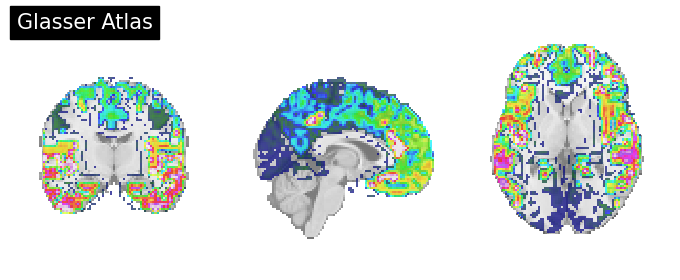

In [82]:
# Visualize parcellation atlas
plot_roi(glasser_maps, draw_cross=False, annotate=False, title="Glasser Atlas")

# Check the fit/shape of each of Glasser ROI's

In [71]:
# Re-sample sub1 coc and pla files, and generate background images to plot each roi.

sub1_coc_re_Gla = image.resample_to_img(sub1_coc, glasser_maps, interpolation='nearest')
sub1_pla_re_Gla = image.resample_to_img(sub1_pla, glasser_maps, interpolation='nearest')

sub1_coc_re_Gla_mean = image.mean_img(sub1_coc_re_Gla)
sub1_pla_re_Gla_mean = image.mean_img(sub1_pla_re_Gla)

In [11]:

#roi_img = nl.image.new_img_like(AA_maps, nl.image.get_data(AA_maps) == int( AA_indices[0] ))

#masker = NiftiMasker(mask_img=roi_img, verbose=False).fit()

#plotting_pla = plot_roi(roi_img, bg_img=sub1_coc_re_AA_mean, black_bg=False, title=str("PLA: " + AA_labels[0]))

Computing and plotting roi_1: Primary_visual_cortex
Computing and plotting roi_2: Medial_superior_temporal_area
Computing and plotting roi_3: Sixth_Visual_Area
Computing and plotting roi_4: Second_Visual_Area
Computing and plotting roi_5: Third_Visual_Area
Computing and plotting roi_6: Forth_Visual_Area
Computing and plotting roi_7: Eighth_Visual_Area
Computing and plotting roi_8: Primary_Motor_Cortex
Computing and plotting roi_9: Primary_Sensory_Cortex
Computing and plotting roi_10: Frontal_Eye_Field
Computing and plotting roi_11: Premotor_Eye_Field
Computing and plotting roi_12: Area_55b
Computing and plotting roi_13: Area_V3A
Computing and plotting roi_14: RetroSplenial_Complex
Computing and plotting roi_15: Parieto-Occipital_Sulcus_Area_2
Computing and plotting roi_16: Seventh_Visual_Area
Computing and plotting roi_17: IntraParietal_Sulcus_Area_1
Computing and plotting roi_18: Fusiform_Face_Complex
Computing and plotting roi_19: Area_V3B
Computing and plotting roi_20: Lateral_Occip

/Users/luisalvarez/opt/anaconda3/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:144: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure = plt.figure(figure, figsize=figsize,


Computing and plotting roi_22: Posterior_InferoTemporal_Complex
Computing and plotting roi_23: Middle_Temporal_Area
Computing and plotting roi_24: Primary_Auditory_Cortex
Computing and plotting roi_25: PeriSylvian_Language_Area
Computing and plotting roi_26: Superior_Frontal_Language_Area
Computing and plotting roi_27: PreCuneus_Visual_Area
Computing and plotting roi_28: Superior_Temporal_Visual_Area
Computing and plotting roi_29: Medial_Area_7P
Computing and plotting roi_30: Area_7m
Computing and plotting roi_31: Parieto-Occipital_Sulcus_Area_1
Computing and plotting roi_32: Area_23d
Computing and plotting roi_33: Area_Ventral_23_a+b
Computing and plotting roi_34: Area_Dorsal_23_a+b
Computing and plotting roi_35: Area_31p_Ventral
Computing and plotting roi_36: Area_5m
Computing and plotting roi_37: Area_5m_ventral
Computing and plotting roi_38: Area_23c
Computing and plotting roi_39: Area_5L
Computing and plotting roi_40: Dorsal_Area_24d
Computing and plotting roi_41: Lateral_Area_7A


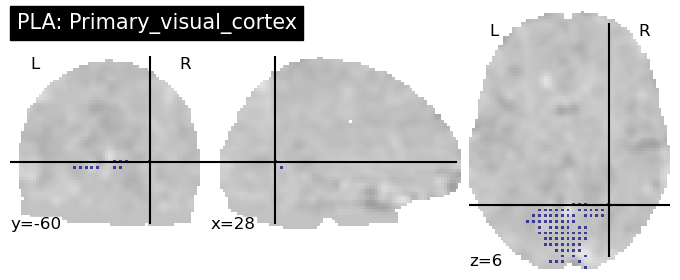

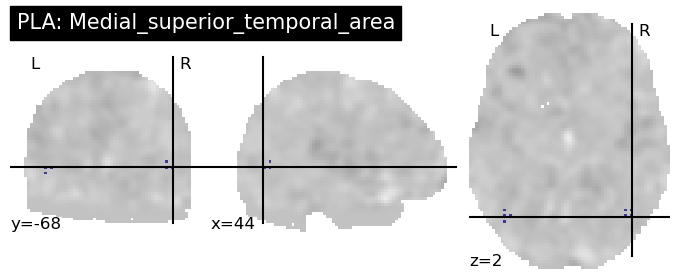

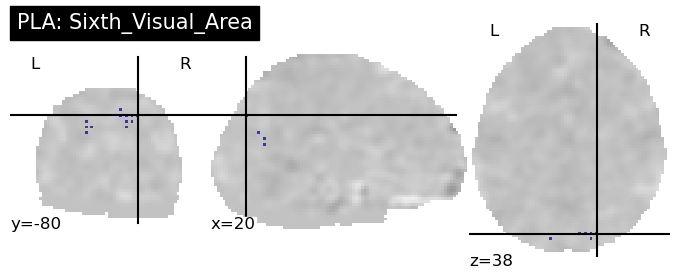

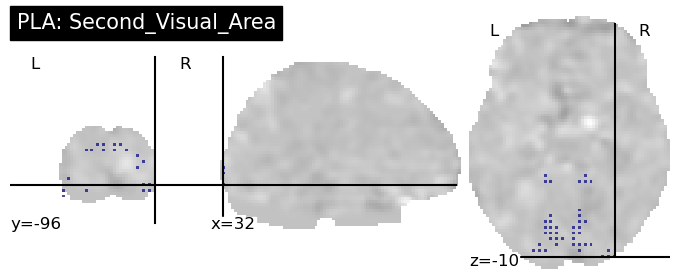

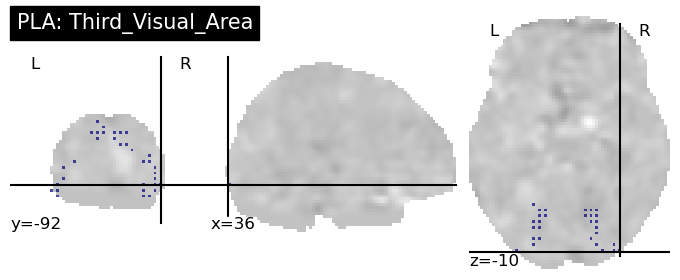

...

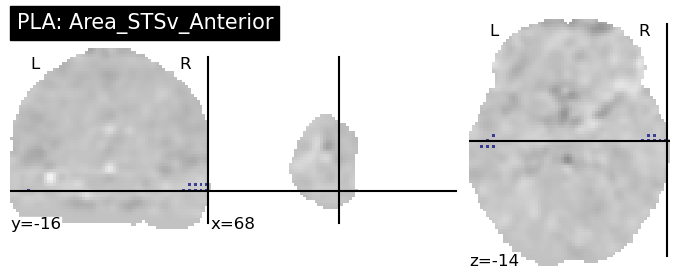

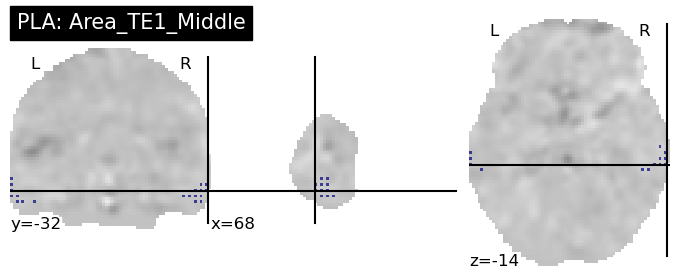

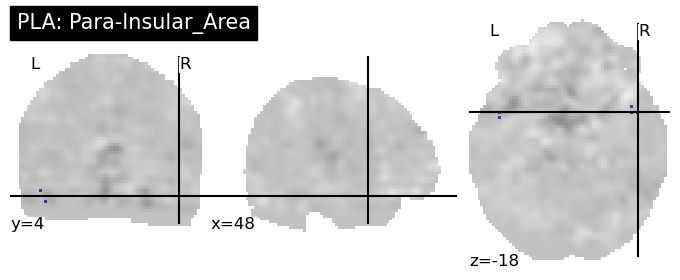

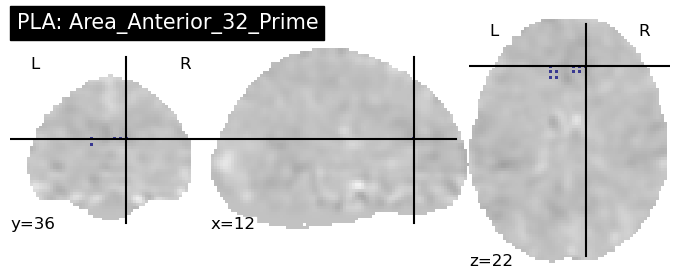

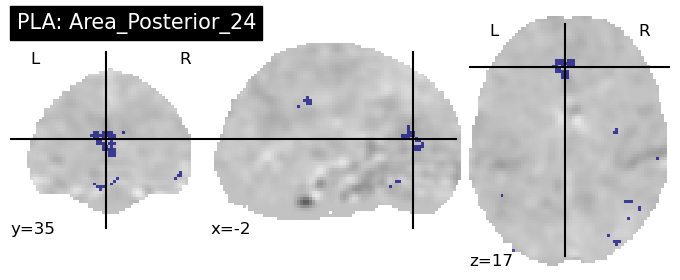

In [106]:
# So, I'm creating a mask for each roi/network in AA atlas and storing it in the variable below.
# Also, the loop below generates two images per roi (one using sub_1_coc as background and another one using sub_1_pla)
# each image is saved into folder Yeo_Roi_img.
GLA_roi_masks = []

for x in range(1, 181, 1):

    try:
        print("Computing and plotting roi_" +str(x) +": " + str(glasser_labels.Labels[x]))
        roi_img = nl.image.new_img_like(glasser_maps, nl.image.get_data(glasser_maps) == x)
        #nl.image.new_img_like(glasser_maps, nl.image.get_data(glasser2) == x )
        masker = NiftiMasker(mask_img=roi_img, verbose=False).fit()
        GLA_roi_masks.append(masker)

        #if(x==115):
        #    break

        #masker_img = masker.mask_img_

        #output_name = "Glasser_Roi_img/AA_Roi_" + str(glasser_labels.Labels[x])

        #plotting_pla = plot_roi(masker_img, bg_img=sub1_pla_re_Gla_mean, black_bg=False, title=str("PLA: " + glasser_labels.Labels[x]))
    
        #plotting_pla.savefig(output_name)
        #plotting_coc.savefig(output_name_coc)
    except FileNotFoundError:
        print("Problem with roi_" +str(x) + " " + str(glasser_labels.Labels[x]))
    

In [107]:
#glasser2_test_roi = nl.image.new_img_like(glasser2, nl.image.get_data(glasser2) == 1)

#plot_roi(glasser2_test_roi, draw_cross=False, annotate=False, title="Glasser Atlas")

In [109]:
#matplotlib.pyplot.close()

# Estimating PC1 for each mask/roi

In [111]:
# Create Dataframe to store each participants PC1 scores. 

COC_PC1_GLA_scores_df = pd.DataFrame(columns=glasser_labels.Labels)
PLA_PC1_GLA_scores_df = pd.DataFrame(columns=glasser_labels.Labels)

COC2_PC1_GLA_scores_df = pd.DataFrame(columns=glasser_labels.Labels)
PLA2_PC1_GLA_scores_df = pd.DataFrame(columns=glasser_labels.Labels)

zeros_holder = np.zeros((1, 180))

# Loop below for paticipants in "PP_1"
for path in os.listdir("CANCOC_PP_1"):
    if os.path.isdir(os.path.join(dir_path1, path)): 
           
        current_p_df = pd.DataFrame(data=zeros_holder, columns=glasser_labels.Labels, index=[path])
        COC_PC1_GLA_scores_df = COC_PC1_GLA_scores_df.append(current_p_df, ignore_index=False)
        PLA_PC1_GLA_scores_df = PLA_PC1_GLA_scores_df.append(current_p_df, ignore_index=False)

for path in os.listdir("CANCOC_PP_2"):
    if os.path.isdir(os.path.join(dir_path2, path)): 
           
        current_p_df = pd.DataFrame(data=zeros_holder, columns=glasser_labels.Labels, index=[path])
        COC2_PC1_GLA_scores_df = COC2_PC1_GLA_scores_df.append(current_p_df, ignore_index=False)
        PLA2_PC1_GLA_scores_df = PLA2_PC1_GLA_scores_df.append(current_p_df, ignore_index=False)

#COC_PC1_scores_df.head(25)

/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_2123/30750255.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  COC_PC1_GLA_scores_df = COC_PC1_GLA_scores_df.append(current_p_df, ignore_index=False)
/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_2123/30750255.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  PLA_PC1_GLA_scores_df = PLA_PC1_GLA_scores_df.append(current_p_df, ignore_index=False)
/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_2123/30750255.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  COC_PC1_GLA_scores_df = COC_PC1_GLA_scores_df.append(current_p_df, ignore_index=False)
/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_2123/30750255.py:17: FutureWarning:

In [124]:
#sub1_PP2_pla_PC1_scores = []

for current_roi in range(116):
    
    #sub1_PP2_pla_PC1_scores.append(fit_mask_get_PC1.remote(aa_roi_masks[current_roi], PLA_PP_2_paths[0]))
    
   




(fit_mask_get_PC1 pid=59065) /Users/luisalvarez/opt/anaconda3/lib/python3.9/site-packages/sklearn/decomposition/_pca.py:545: RuntimeWarning: invalid value encountered in divide
(fit_mask_get_PC1 pid=59065)   explained_variance_ratio_ = explained_variance_ / total_var
(fit_mask_get_PC1 pid=59065) /Users/luisalvarez/opt/anaconda3/lib/python3.9/site-packages/sklearn/decomposition/_pca.py:545: RuntimeWarning: invalid value encountered in divide [repeated 3x across cluster]
(fit_mask_get_PC1 pid=59065)   explained_variance_ratio_ = explained_variance_ / total_var [repeated 3x across cluster]
(fit_mask_get_PC1 pid=59066) /Users/luisalvarez/opt/anaconda3/lib/python3.9/site-packages/sklearn/decomposition/_pca.py:545: RuntimeWarning: invalid value encountered in divide [repeated 4x across cluster]
(fit_mask_get_PC1 pid=59066)   explained_variance_ratio_ = explained_variance_ / total_var [repeated 4x across cluster]
(fit_mask_get_PC1 pid=59064)   self.explained_variance_ratio_ = self.explained_v

In [126]:
#sub1_PP2_PLA_scores = ray.get(sub1_PP2_pla_PC1_scores) 
#sub2_PP2_PLA_scores = ray.get(sub2_PP2_pla_PC1_scores) 
#sub3_PP2_PLA_scores = ray.get(sub3_PP2_pla_PC1_scores) 
#sub4_PP2_PLA_scores = ray.get(sub4_PP2_pla_PC1_scores) 
#sub5_PP2_PLA_scores = ray.get(sub5_PP2_pla_PC1_scores) 
#sub6_PP2_PLA_scores = ray.get(sub6_PP2_pla_PC1_scores) 
#sub7_PP2_PLA_scores = ray.get(sub7_PP2_pla_PC1_scores) 
#sub8_PP2_PLA_scores = ray.get(sub8_PP2_pla_PC1_scores) 
#sub9_PP2_PLA_scores = ray.get(sub9_PP2_pla_PC1_scores) 
#sub10_PP2_PLA_scores = ray.get(sub10_PP2_pla_PC1_scores) 
#sub11_PP2_PLA_scores = ray.get(sub11_PP2_pla_PC1_scores) 
#sub12_PP2_PLA_scores = ray.get(sub12_PP2_pla_PC1_scores) 
#sub13_PP2_PLA_scores = ray.get(sub13_PP2_pla_PC1_scores) 
#sub14_PP2_PLA_scores = ray.get(sub14_PP2_pla_PC1_scores)
#sub15_PP2_PLA_scores = ray.get(sub15_PP2_pla_PC1_scores) 
#sub16_PP2_PLA_scores = ray.get(sub16_PP2_pla_PC1_scores) 
#sub17_PP2_PLA_scores = ray.get(sub17_PP2_pla_PC1_scores) 
#sub18_PP2_PLA_scores = ray.get(sub18_PP2_pla_PC1_scores) 
#sub19_PP2_PLA_scores = ray.get(sub19_PP2_pla_PC1_scores) 
#sub20_PP2_PLA_scores = ray.get(sub20_PP2_pla_PC1_scores) 

#PLA2_PC1_AA_scores_df.iloc[0] = sub1_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[1] = sub2_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[2] = sub3_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[3] = sub4_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[4] = sub5_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[5] = sub6_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[6] = sub7_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[7] = sub8_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[8] = sub9_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[9] = sub10_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[10] = sub11_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[11] = sub12_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[12] = sub13_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[13] = sub14_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[14] = sub15_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[15] = sub16_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[16] = sub17_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[17] = sub18_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[18] = sub19_PP2_PLA_scores[:]
#PLA2_PC1_AA_scores_df.iloc[19] = sub20_PP2_PLA_scores[:]


#PLA2_PC1_AA_scores_df.head(20)


,Precentral_L,Precentral_R,Frontal_Sup_L,Frontal_Sup_R,Frontal_Sup_Orb_L,Frontal_Sup_Orb_R,Frontal_Mid_L,Frontal_Mid_R,Frontal_Mid_Orb_L,Frontal_Mid_Orb_R,...,Cerebelum_10_L,Cerebelum_10_R,Vermis_1_2,Vermis_3,Vermis_4_5,Vermis_6,Vermis_7,Vermis_8,Vermis_9,Vermis_10
P5259,0.272111,0.261629,0.165265,0.157443,0.276179,0.309429,0.155335,0.150523,0.771965,0.764516,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P5232,0.379306,0.550232,0.407246,0.321239,0.761214,0.801999,0.311654,0.253981,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P5235,0.292047,0.244793,0.211842,0.218479,0.400203,0.445640,0.252202,0.310726,0.579083,0.539283,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P5258,0.283618,0.237036,0.207185,0.247248,0.311193,0.388828,0.233678,0.230093,0.620049,0.692292,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P52125,0.391317,0.309331,0.207156,0.179609,0.598259,0.501062,0.213230,0.240705,0.540689,0.542971,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P5260,0.439438,0.362531,0.268397,0.246535,0.350235,0.297061,0.301903,0.315726,0.442068,0.289263,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P5234,0.329632,0.391015,0.282667,0.312342,0.588865,0.570252,0.185804,0.256389,1.000001,0.965824,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P5233,0.398156,0.380293,0.196100,0.245845,0.375145,0.412820,0.257471,0.259411,0.498510,0.490948,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P5245,0.342576,0.301199,0.250478,0.227173,0.592767,0.596560,0.177956,0.213268,0.741324,0.832909,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
P5244,0.204303,0.292266,0.270809,0.195666,0.294593,0.317372,0.228422,0.165080,0.511805,0.578679,...,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [130]:
#COC_PC1_AA_scores_df.to_csv('/Users/luisalvarez/Documents/GitHub/ResearchElective_2023/AAFIT_COC_PP1_scores.csv')
#PLA_PC1_AA_scores_df.to_csv('/Users/luisalvarez/Documents/GitHub/ResearchElective_2023/AAFIT_PLA_PP1_scores.csv')
#COC2_PC1_AA_scores_df.to_csv('/Users/luisalvarez/Documents/GitHub/ResearchElective_2023/AAFIT_COC_PP2_scores.csv')
#PLA2_PC1_AA_scores_df.to_csv('/Users/luisalvarez/Documents/GitHub/ResearchElective_2023/AAFIT_PLA_PP2_scores.csv')

COC_PC1_AA_scores_df = pd.read_csv('/Users/luisalvarez/Documents/GitHub/ResearchElective_2023/AAFIT_COC_PP1_scores.csv', index_col=0)
COC2_PC1_AA_scores_df = pd.read_csv('/Users/luisalvarez/Documents/GitHub/ResearchElective_2023/AAFIT_COC_PP2_scores.csv', index_col=0)
PLA_PC1_AA_scores_df = pd.read_csv('/Users/luisalvarez/Documents/GitHub/ResearchElective_2023/AAFIT_PLA_PP1_scores.csv', index_col=0)
PLA2_PC1_AA_scores_df = pd.read_csv('/Users/luisalvarez/Documents/GitHub/ResearchElective_2023/AAFIT_PLA_PP2_scores.csv', index_col=0)
#COC_PC1_AA_scores_df.head()

# Visualizing Results

## COC PP1

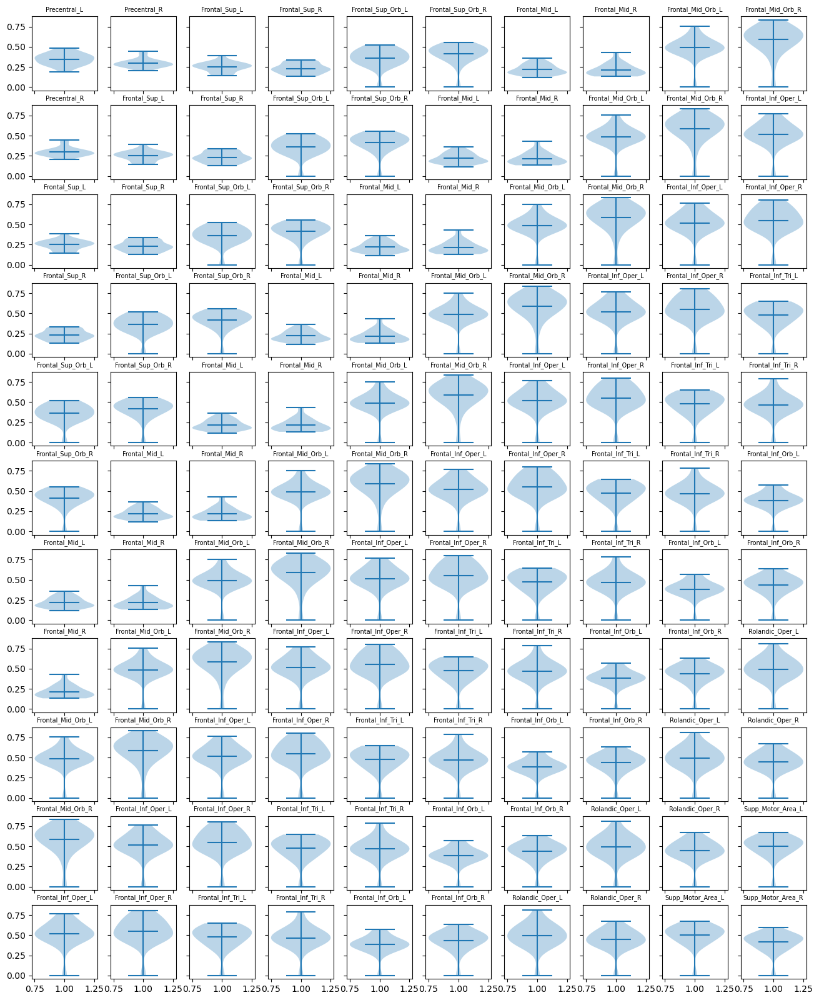

In [19]:
COC_PC1_AA_scores_df_cols = COC_PC1_AA_scores_df.columns
COC_PC1_AA_scores_df.fillna(0,inplace=True)

fig, axs = plt.subplots(11, 10, figsize=(16, 20), sharex=True, sharey=True)

for x in range(11):
    for y in range(10):
        current_roi = COC_PC1_AA_scores_df.columns[x+y]
        axs[x, y].violinplot(COC_PC1_AA_scores_df[current_roi] , vert=True, showmeans=True)
        axs[x, y].set_title(current_roi, fontsize=7)
        


In [20]:

COC_AA_COC1_avg_fit = []

for x in range(len(AA_labels)):
    COC_AA_COC1_avg_fit.append(COC_PC1_AA_scores_df[AA_labels[x]].mean(skipna=True))
    
#COC_AA_COC1_avg_fit
    

In [140]:
COC_AA_COC1_avg_fit[100]

0.33029168620705607

In [21]:

#ray.shutdown()

AA_masks_avg_fit_vis = []

for x in range(len(AA_labels)):
    shit_another_mask = aa_roi_masks[x].fit_transform(COC_PP_1_paths[0])
    #yeo_roi_masks[current_roi].fit_transform(sub1_pla) 
    runner = shit_another_mask.shape[1]
    score = COC_AA_COC1_avg_fit[x]
    zeros_mask = np.zeros((1, runner))
    zeros_mask[0, :] = score*100
    AA_masks_avg_fit_vis.append(aa_roi_masks[x].inverse_transform(zeros_mask))
    
    

In [22]:
# Make zero matrix (to get the shape right) ... then run for loop and sum all matrices.
zero_matrix = nl.image.get_data(AA_masks_avg_fit_vis[0]).shape
COC_AA_COC1_avg_fit_vis = np.zeros((zero_matrix))

# Run loop for times (number of rois). Each iteration get matrix with PC1 scores for that roi
# And add it to the "COC_AA_COC1_avg_fit_vis."
for x in range(len(AA_labels)):
    current_roi_scores = nl.image.get_data(AA_masks_avg_fit_vis[x])
    COC_AA_COC1_avg_fit_vis = COC_AA_COC1_avg_fit_vis + current_roi_scores

COC_AA_COC1_avg_fit_vis = nl.image.new_img_like(AA_maps, COC_AA_COC1_avg_fit_vis)

In [24]:
from nilearn import datasets
from nilearn import surface
from nilearn import plotting

fsaverage = datasets.fetch_surf_fsaverage()

texture = surface.vol_to_surf(COC_AA_COC1_avg_fit_vis.slicer[:, :, :, 0], fsaverage.pial_right, n_samples=1, interpolation="nearest")

figure = plotting.view_surf(fsaverage.pial_right, texture, cmap='viridis', symmetric_cmap=False) 

figure


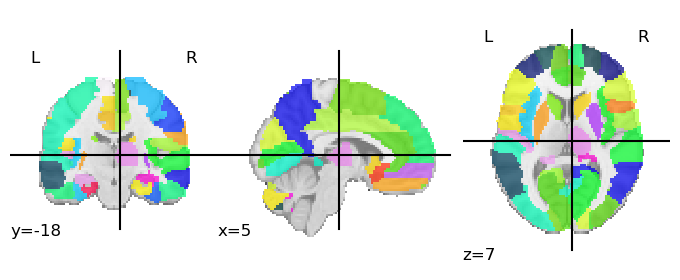

In [25]:
plot_roi(COC_AA_COC1_avg_fit_vis.slicer[:, :, :, 0]) 

## PLA PP1

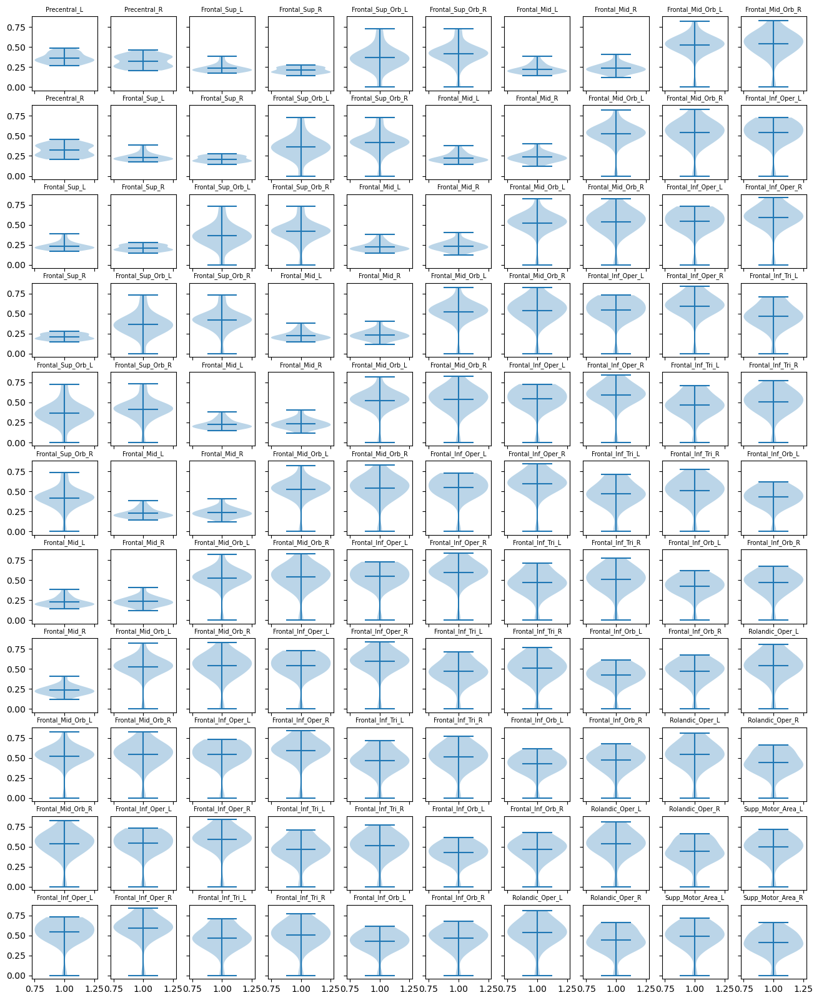

In [17]:
PLA_PC1_AA_scores_df.fillna(0,inplace=True)

fig, axs = plt.subplots(11, 10, figsize=(16, 20), sharex=True, sharey=True)

for x in range(11):
    for y in range(10):
        current_roi = PLA_PC1_AA_scores_df.columns[x+y]
        axs[x, y].violinplot(PLA_PC1_AA_scores_df[current_roi], vert=True, showmeans=True)
        axs[x, y].set_title(current_roi, fontsize=7)

In [26]:
PLA_AA_PC1_avg_fit = []

for x in range(len(AA_labels)):
    PLA_AA_PC1_avg_fit.append(PLA_PC1_AA_scores_df[AA_labels[x]].mean(skipna=True))

In [27]:

AA_masks_avg_fit_vis2 = []

for x in range(len(AA_labels)):
    shit_another_mask = aa_roi_masks[x].fit_transform(PLA_PP_1_paths[0])
    runner = shit_another_mask.shape[1]
    score = PLA_AA_PC1_avg_fit[x]
    zeros_mask = np.zeros((1, runner))
    zeros_mask[0, :] = score*100
    AA_masks_avg_fit_vis2.append(aa_roi_masks[x].inverse_transform(zeros_mask))

In [30]:
# Make zero matrix (to get the shape right) ... then run for loop and sum all matrices.
zero_matrix = nl.image.get_data(AA_masks_avg_fit_vis[0]).shape
PLA_AA_PC1_avg_fit_vis = np.zeros((zero_matrix))

# Run loop for times (number of rois). Each iteration get matrix with PC1 scores for that roi
# And add it to the "COC_AA_COC1_avg_fit_vis."
for x in range(len(AA_labels)):
    current_roi_scores = nl.image.get_data(AA_masks_avg_fit_vis2[x])
    PLA_AA_PC1_avg_fit_vis = PLA_AA_PC1_avg_fit_vis + current_roi_scores

PLA_AA_PC1_avg_fit_vis = nl.image.new_img_like(AA_maps, PLA_AA_PC1_avg_fit_vis)

In [31]:
texture2 = surface.vol_to_surf(PLA_AA_PC1_avg_fit_vis.slicer[:, :, :, 0], fsaverage.pial_right, n_samples=1, interpolation="nearest")

figure2 = plotting.view_surf(fsaverage.pial_right, texture2, cmap='viridis', symmetric_cmap=False) 

figure2

## COC PP2


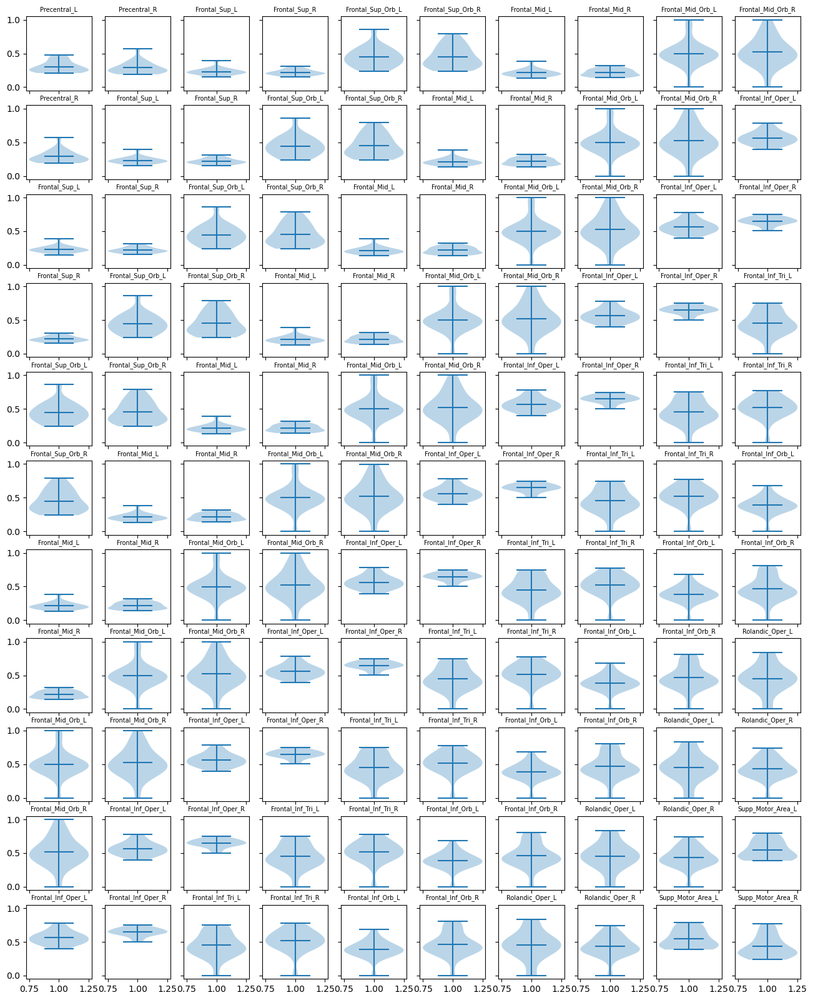

In [88]:
COC2_PC1_AA_scores_df.fillna(0,inplace=True)

fig, axs = plt.subplots(11, 10, figsize=(16, 20), sharex=True, sharey=True)

for x in range(11):
    for y in range(10):
        current_roi = COC2_PC1_AA_scores_df.columns[x+y]
        axs[x, y].violinplot(COC2_PC1_AA_scores_df[current_roi] , vert=True, showmeans=True)
        axs[x, y].set_title(current_roi, fontsize=7)

In [89]:

COC_AA_COC2_avg_fit = []

for x in range(len(AA_labels)):
    COC_AA_COC2_avg_fit.append(COC2_PC1_AA_scores_df[AA_labels[x]].mean(skipna=True))

In [95]:
AA_masks_avg_fit_vis3 = []

for x in range(len(AA_labels)):
    shit_another_mask = aa_roi_masks[x].fit_transform(COC_PP_2_paths[0])
    runner = shit_another_mask.shape[1]
    score = COC_AA_COC2_avg_fit[x]
    zeros_mask = np.zeros((1, runner))
    zeros_mask[0, :] = score*100
    AA_masks_avg_fit_vis3.append(aa_roi_masks[x].inverse_transform(zeros_mask))

In [96]:
# Make zero matrix (to get the shape right) ... then run for loop and sum all matrices.
zero_matrix = nl.image.get_data(AA_masks_avg_fit_vis3[0]).shape
COC2_AA_PC1_avg_fit_vis = np.zeros((zero_matrix))

# Run loop for times (number of rois). Each iteration get matrix with PC1 scores for that roi
# And add it to the "COC_AA_COC1_avg_fit_vis."
for x in range(len(AA_labels)):
    current_roi_scores = nl.image.get_data(AA_masks_avg_fit_vis3[x])
    COC2_AA_PC1_avg_fit_vis = COC2_AA_PC1_avg_fit_vis + current_roi_scores

COC2_AA_PC1_avg_fit_vis = nl.image.new_img_like(AA_maps, COC2_AA_PC1_avg_fit_vis)

In [97]:
texture3 = surface.vol_to_surf(COC2_AA_PC1_avg_fit_vis.slicer[:, :, :, 0], fsaverage.pial_right, n_samples=1, interpolation="nearest")

figure3 = plotting.view_surf(fsaverage.pial_right, texture3, cmap='viridis', symmetric_cmap=False) 

figure3

## PLA PP2


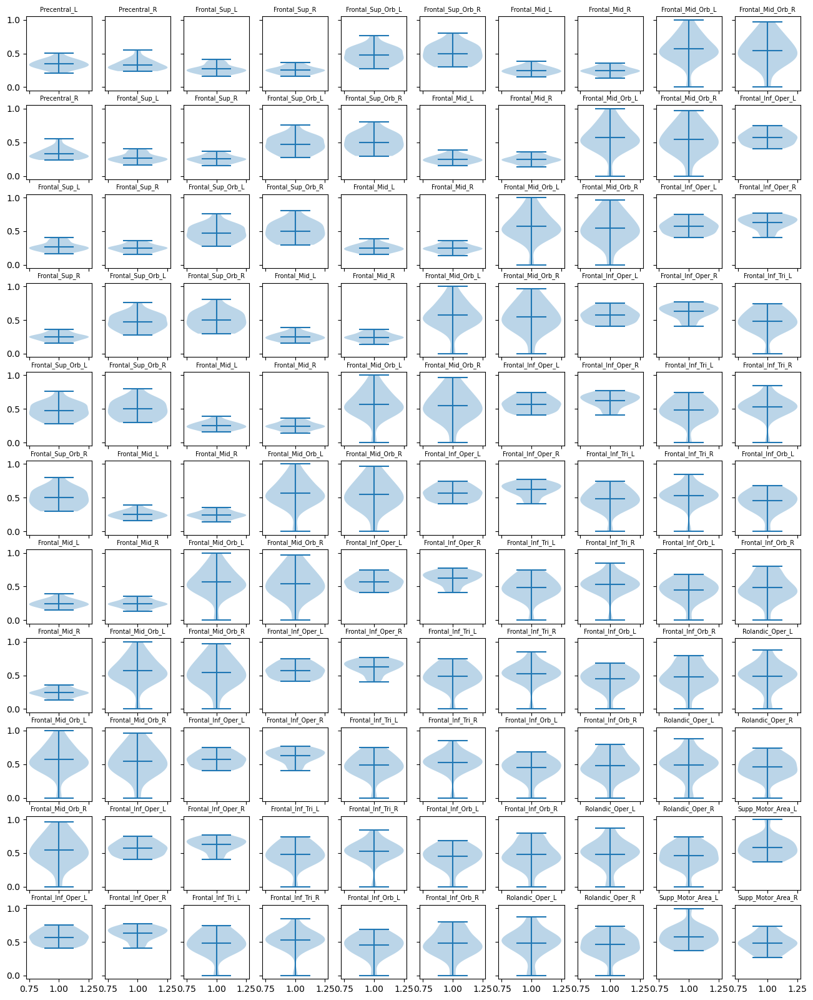

In [131]:
PLA2_PC1_AA_scores_df.fillna(0,inplace=True)

fig, axs = plt.subplots(11, 10, figsize=(16, 20), sharex=True, sharey=True)

for x in range(11):
    for y in range(10):
        current_roi = PLA2_PC1_AA_scores_df.columns[x+y]
        axs[x, y].violinplot(PLA2_PC1_AA_scores_df[current_roi] , vert=True, showmeans=True)
        axs[x, y].set_title(current_roi, fontsize=7)

In [132]:
PLA2_AA_PC1_avg_fit = []

for x in range(len(AA_labels)):
    PLA2_AA_PC1_avg_fit.append(PLA2_PC1_AA_scores_df[AA_labels[x]].mean(skipna=True))

In [134]:

AA_masks_avg_fit_vis4 = []

for x in range(len(AA_labels)):
    shit_another_mask = aa_roi_masks[x].fit_transform(PLA_PP_2_paths[0])
    runner = shit_another_mask.shape[1]
    score = PLA2_AA_PC1_avg_fit[x]
    zeros_mask = np.zeros((1, runner))
    zeros_mask[0, :] = score*100
    AA_masks_avg_fit_vis4.append(aa_roi_masks[x].inverse_transform(zeros_mask))

In [135]:
# Make zero matrix (to get the shape right) ... then run for loop and sum all matrices.
zero_matrix = nl.image.get_data(AA_masks_avg_fit_vis4[0]).shape
PLA2_AA_PC1_avg_fit_vis = np.zeros((zero_matrix))

# Run loop for times (number of rois). Each iteration get matrix with PC1 scores for that roi
# And add it to the "COC_AA_COC1_avg_fit_vis."
for x in range(len(AA_labels)):
    current_roi_scores = nl.image.get_data(AA_masks_avg_fit_vis4[x])
    PLA2_AA_PC1_avg_fit_vis = PLA2_AA_PC1_avg_fit_vis + current_roi_scores

PLA2_AA_PC1_avg_fit_vis = nl.image.new_img_like(AA_maps, PLA2_AA_PC1_avg_fit_vis)

In [136]:
texture4 = surface.vol_to_surf(PLA2_AA_PC1_avg_fit_vis.slicer[:, :, :, 0], fsaverage.pial_right, n_samples=1, interpolation="nearest")

figure4 = plotting.view_surf(fsaverage.pial_right, texture4, cmap='viridis', symmetric_cmap=False) 

figure4